# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">Playground Series S3E15</p>

In [374]:
# %load ../initial_settings2.py
import os
import shutil
import subprocess
import sys
import warnings
from pathlib import Path

ON_KAGGLE = os.getenv("KAGGLE_KERNEL_RUN_TYPE") is not None
if ON_KAGGLE:
    warnings.filterwarnings("ignore")
    os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import tensorflow as tf
import tensorflow_datasets as tfds

# Sub-modules and so on.
from colorama import Fore, Style
from IPython.core.display import HTML
from IPython.display import display_html
from keras import layers
from plotly.subplots import make_subplots
from tensorflow import keras

K = keras.backend

# Colorama settings.
CLR = (Style.BRIGHT + Fore.BLACK) if ON_KAGGLE else (Style.BRIGHT + Fore.WHITE)
RED = Style.BRIGHT + Fore.RED
BLUE = Style.BRIGHT + Fore.BLUE
CYAN = Style.BRIGHT + Fore.CYAN
RESET = Style.RESET_ALL

# Colors
DF_CMAP = sns.light_palette("#8C92AC", as_cmap=True)
FONT_COLOR = "#2D3142"
BACKGROUND_COLOR = "#F6F5F5"
NOTEBOOK_PALETTE = {
    "Coral": "#FF7F51",
    "DarkNavy": "#2D3142",
    "SlateBlue": "#8C92AC",
}
MY_RC = {
    "axes.labelcolor": FONT_COLOR,
    "axes.labelsize": 10,
    "axes.labelpad": 15,
    "axes.labelweight": "bold",
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
    "axes.titlepad": 15,
    "axes.facecolor": BACKGROUND_COLOR,
    "xtick.labelsize": 10,
    "xtick.color": FONT_COLOR,
    "ytick.labelsize": 10,
    "ytick.color": FONT_COLOR,
    "figure.titlesize": 14,
    "figure.titleweight": "bold",
    "figure.facecolor": BACKGROUND_COLOR,
    "figure.edgecolor": BACKGROUND_COLOR,
    "figure.dpi": 72,  # Locally Seaborn uses 72, meanwhile Kaggle 96.
    "font.size": 10,
    "font.family": "Serif",
    "text.color": FONT_COLOR,
}

sns.set_theme(rc=MY_RC)


# Utility functions.
def download_dataset_from_kaggle(user, dataset, directory):
    command = "kaggle datasets download -d "
    filepath = directory / (dataset + ".zip")

    if not filepath.is_file():
        subprocess.run((command + user + "/" + dataset).split())
        filepath.parent.mkdir(parents=True, exist_ok=True)
        shutil.unpack_archive(dataset + ".zip", "data")
        shutil.move(dataset + ".zip", "data")


def download_competition_from_kaggle(competition):
    command = "kaggle competitions download -c "
    filepath = Path("data/" + competition + ".zip")

    if not filepath.is_file():
        subprocess.run((command + competition).split())
        Path("data").mkdir(parents=True, exist_ok=True)
        shutil.unpack_archive(competition + ".zip", "data")
        shutil.move(competition + ".zip", "data")


# Html `code` block highlight.
HTML(
    """
<style>
code {
    background: rgba(42, 53, 125, 0.10) !important;
    border-radius: 4px !important;
}
</style>
"""
)


<b><span style="font-size:20px; font-family:JetBrains Mono; margin-left: 5px;">
    Competition Description 📜
</span></b>
<p style="font-size:16px;font-family: JetBrains Mono; margin-left: 25px; margin-right: 25px; margin-top: 15px; margin-bottom: 20px">
    The dataset for this competition (both train and test) was generated from a deep learning model trained on the <a href="https://www.kaggle.com/datasets/saurabhshahane/predicting-heat-flux">Predicting Critical Heat Flux</a> dataset. Feature distributions are close to, but not exactly the same, as the original. Feel free to use the original dataset as part of this competition, both to explore differences as well as to see whether incorporating the original in training improves model performance.
</p>
<b><span style="font-size:20px; font-family:JetBrains Mono; margin-left: 5px;">
    Task 🕵
</span></b>
<p style="font-size:16px;font-family: JetBrains Mono; margin-left: 25px; margin-right: 25px; margin-top: 15px; margin-bottom: 20px">
    The objective is to impute the missing values of the feature <code>x_e_out [-]</code> (equilibrium quality).
</p>
<b><span style="font-size:20px;font-family:JetBrains Mono; margin-left: 5px;">
    This Notebook Covers 📔
</span></b>
<ul style="font-size:16px; font-family: JetBrains Mono; margin-left: 10px; margin-right: 15px; margin-top: 15px; margin-bottom: 20px">
    <li>Quick overview of the dataset.</li>
    <li>Relationships in numerical features, e.g. pair plots, correlation matrix, pivot tables.</li>
    <li>Kernel density estimation plots and probability plots.</li>
    <li>Relationships in categorial features, e.g. bar plots and pivot tables.</li>
    <li>Dataset projection with t-SNE.</li>
    <li></li>
    <li></li>
</ul>
<b><span style="font-size:20px;font-family:JetBrains Mono; margin-left: 5px;">
    See More Here 📈
</span></b>
<p style="font-size:16px; font-family: JetBrains Mono; margin-left: 25px; margin-right: 25px; margin-top: 15px; margin-bottom: 20px">
    <a href="https://www.kaggle.com/competitions/playground-series-s3e15/overview">Playground Series - Season 3, Episode 15</a>
</p>

# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">Quick Overview</p>

<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Notes</b> 📜</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Let's get started with general information about the dataset.</li>
</ul>

In [249]:
competition = "playground-series-s3e15"

if not ON_KAGGLE:
    download_competition_from_kaggle(competition)
    data_path = "data/data.csv"
else:
    data_path = f"/kaggle/input/{competition}/data.csv"

data = pd.read_csv(data_path, index_col="id")


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Features Description</b> 📜</p>
<p style="font-size:16px;font-family: JetBrains Mono; margin-left: 20px; margin-right: 25px; margin-top: 15px; margin-bottom: 20px">
    The features description you see below comes from <a href="https://www.kaggle.com/competitions/playground-series-s3e15/discussion/410790">Dataset Features Explained</a> posted by <a href="https://www.kaggle.com/alejopaullier">moth</a>.
</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li><code>author</code> - Author.</li>
    <li><code>geometry</code> - Geometry.</li>
    <li><code>pressure [MPa]</code> - Pressure of the pressurized water reactor (boiling system) in MPa (kg/m·s²).</li>
    <li><code>mass_flux [kg/m2-s]</code> - Amount of mass that passes through a given area per unit of time (kg/m2·s).</li>
    <li><code>x_e_out [-]</code> - Equilibrium (or thermodynamic) quality. An adimensional factor.</li>
    <li><code>D_e [mm]</code> - Channel equivalent (or hydraulic) diameter (mm). In simple words its just a concept that simplifies the analysis of flow in non-circular geometries by considering an equivalent circular channel with the same hydraulic resistance. It is a characteristic length scale used to describe the flow of fluid through a channel, duct, or pipe of non-circular cross-section.</li>
    <li><code>D_h [mm]</code> - Channel heated diameter (mm).</li>
    <li><code>length [mm]</code> - Heated length (mm).</li>
    <li><code>chf_exp [MW/m2]</code> - Experimental critical heat flux. Is a regulatory limit for commercial pressurized water reactors (PWRs) worldwide. Its unit is MW/m2 or in SI base units (kg/s³).</li>
</ul>

In [250]:
data.head()


,author,geometry,pressure [MPa],mass_flux [kg/m2-s],x_e_out [-],D_e [mm],D_h [mm],length [mm],chf_exp [MW/m2]
id,,,,,,,,,
0,Thompson,tube,7.00,3770.0,0.1754,NaN,10.8,432.0,3.6
1,Thompson,tube,NaN,6049.0,-0.0416,10.3,10.3,762.0,6.2
2,Thompson,NaN,13.79,2034.0,0.0335,7.7,7.7,457.0,2.5
3,Beus,annulus,13.79,3679.0,-0.0279,5.6,15.2,2134.0,3.0
4,NaN,tube,13.79,686.0,NaN,11.1,11.1,457.0,2.8


In [251]:
data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 31644 entries, 0 to 31643
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   author               26620 non-null  object 
 1   geometry             26144 non-null  object 
 2   pressure [MPa]       27192 non-null  float64
 3   mass_flux [kg/m2-s]  26853 non-null  float64
 4   x_e_out [-]          21229 non-null  float64
 5   D_e [mm]             26156 non-null  float64
 6   D_h [mm]             27055 non-null  float64
 7   length [mm]          26885 non-null  float64
 8   chf_exp [MW/m2]      31644 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.4+ MB


In [252]:
for feature in data.columns:
    print(
        (CLR + feature).ljust(30),
        (RED + str(data[feature].isna().sum())).ljust(20),
        (RED + f"{data[feature].isna().sum() / len(data):.1%}" + RESET).ljust(20),
    )

author                5024        15.9%  
geometry              5500        17.4%  
pressure [MPa]        4452        14.1%  
mass_flux [kg/m2-s]   4791        15.1%  
x_e_out [-]           10415       32.9%  
D_e [mm]              5488        17.3%  
D_h [mm]              4589        14.5%  
length [mm]           4759        15.0%  
chf_exp [MW/m2]       0           0.0%   


In [253]:
categories_only = data.select_dtypes("object").columns
numeric_only = data.select_dtypes("number").columns

data_cp = data.copy()
data_cp["x_e_out_missing"] = data_cp["x_e_out [-]"].isna()


In [254]:
fig = px.pie(
    data.assign(x_e_out_missing=data["x_e_out [-]"].isna().astype(str)),
    names="x_e_out_missing",
    height=520,
    width=840,
    hole=0.65,
    title="Imputation Target Overview - x_e_out [-]",
    color_discrete_sequence=["#2D3142", "#FF7F51"],
)
fig.update_layout(
    font_color=FONT_COLOR,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    showlegend=False,
)
fig.add_annotation(
    dict(
        x=0.5,
        y=0.5,
        align="center",
        xref="paper",
        yref="paper",
        showarrow=False,
        font_size=22,
        text="x_e_out [-]<br>Missing Values",
    )
)
fig.update_traces(
    hovertemplate=None,
    textposition="outside",
    texttemplate="%{label}<br>%{value} - %{percent}",
    textfont_size=16,
    rotation=20,
    marker_line_width=15,
    marker_line_color=BACKGROUND_COLOR,
)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>The dataset is relatively small, made of $31643$ samples.</li>
    <li>There are nine attributes at all, including two categorical features. These are <code>author</code> and <code>geometry</code>. The rest of the dataset is composed of numerical ones (seven).</li>
    <li>Each feature needs imputation except the <code>chf_exp [MW/m2]</code> - all values are available here. The ratio of missing values usually oscillates between 14% and 17% of dataset size, except the <code>x_e_out [-]</code>, our main target, where this ratio exceeds 32%.</li>
</ul>

# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">Relationships in Numerical Features</p>

<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Notes</b> 📜</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Let's look at numerical features and their relations with each other.</li>
    <li>We will start with a numerical summary and then create pair plots and a correlation matrix.</li>
</ul>

In [260]:
data_cp.describe().T.rename(columns=str.title).style.background_gradient(DF_CMAP)


,Count,Mean,Std,Min,25%,50%,75%,Max
pressure [MPa],27192.000000,10.640747,4.333683,0.100000,6.890000,11.070000,13.790000,20.680000
mass_flux [kg/m2-s],26853.000000,3068.011023,1777.032080,0.000000,1519.000000,2731.000000,4069.000000,7975.000000
x_e_out [-],21229.000000,-0.000453,0.100911,-0.866700,-0.046600,0.003800,0.064800,0.232000
D_e [mm],26156.000000,8.629255,5.185692,1.000000,5.000000,7.800000,10.800000,37.500000
D_h [mm],27055.000000,14.174330,19.838489,1.000000,5.600000,10.000000,11.500000,120.000000
length [mm],26885.000000,832.987391,672.299239,10.000000,318.000000,610.000000,914.000000,3048.000000
chf_exp [MW/m2],31644.000000,3.796985,1.983991,0.800000,2.400000,3.400000,4.600000,19.300000


In [261]:
fig = px.scatter_matrix(
    data_cp,
    dimensions=numeric_only,
    color="x_e_out_missing",
    color_discrete_sequence=["#2D3142", "#FF7F51"],
    symbol="x_e_out_missing",
    symbol_sequence=["diamond", "circle"],
    opacity=0.2,
    title="Numerical Features - Scatter Pair Plots",
    width=840,
    height=840,
)
fig.update_traces(
    diagonal_visible=False,
    showupperhalf=False,
    marker_size=1,
)
fig.update_layout(
    font_color=FONT_COLOR,
    font_size=9,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        xanchor="right",
        y=1,
        x=1,
        itemsizing="constant",
    ),
)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Even now, we can observe that there is no special relation with missing values in <code>x_e_out [-]</code> and other attributes since the pair plots are similar in both scenarios.</li>
    <li>You can turn off a given group by clicking on the <code>True</code> or <code>False</code> in the legend. It's easy to notice then that groups overlap.</li> 
</ul>

In [262]:
col_names_map = {
    "mean": "X_e_out Null Rate",
    "sum": "Null Values",
    "count": "Total Values",
}

numeric_pivots = []

for feature in numeric_only.difference(["x_e_out [-]"]):
    pivot = (
        data_cp.pivot_table(
            values="x_e_out_missing",
            index=pd.cut(data_cp[feature], 5),  # type: ignore
            aggfunc=["mean", "sum", "count"],
            margins=True,
            margins_name="Total",
        )
        .rename(columns=col_names_map)
        .droplevel(level=1, axis="columns")
        .style.background_gradient(DF_CMAP)  # type: ignore
        .set_table_attributes("style='display:inline'")
    )
    numeric_pivots.append(pivot)


In [263]:
display_html(numeric_pivots[0]._repr_html_() + numeric_pivots[1]._repr_html_(), raw=True)


,X_e_out Null Rate,Null Values,Total Values
D_e [mm],,,
"(0.964, 8.3]",0.322975,4282,13258
"(8.3, 15.6]",0.330941,3919,11842
"(15.6, 22.9]",0.353383,47,133
"(22.9, 30.2]",0.341906,226,661
"(30.2, 37.5]",0.358779,94,262
Total,0.329130,10415,31644
,X_e_out Null Rate,Null Values,Total Values
D_h [mm],,,
"(0.881, 24.8]",0.331308,8126,24527


In [264]:
display_html(numeric_pivots[2]._repr_html_() + numeric_pivots[3]._repr_html_(), raw=True)


,X_e_out Null Rate,Null Values,Total Values
chf_exp [MW/m2],,,
"(0.782, 4.5]",0.331213,7707,23269
"(4.5, 8.2]",0.323271,2388,7387
"(8.2, 11.9]",0.326693,246,753
"(11.9, 15.6]",0.317972,69,217
"(15.6, 19.3]",0.277778,5,18
Total,0.329130,10415,31644
,X_e_out Null Rate,Null Values,Total Values
length [mm],,,
"(6.962, 617.6]",0.323841,4469,13800


In [265]:
display_html(numeric_pivots[4]._repr_html_() + numeric_pivots[5]._repr_html_(), raw=True)


,X_e_out Null Rate,Null Values,Total Values
mass_flux [kg/m2-s],,,
"(-7.975, 1595.0]",0.324289,2474,7629
"(1595.0, 3190.0]",0.333859,2542,7614
"(3190.0, 4785.0]",0.334674,2330,6962
"(4785.0, 6380.0]",0.326328,1087,3331
"(6380.0, 7975.0]",0.317388,418,1317
Total,0.329130,10415,31644
,X_e_out Null Rate,Null Values,Total Values
pressure [MPa],,,
"(0.0794, 4.216]",0.324435,790,2435


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>The above pivot tables confirm our previous statement. See that the missing value rate in the <code>x_e_out [-]</code> feature almost always fluctuates around 33%. The cut-off level in other attributes is meaningless.</li>
    <li>We could slowly claim that missing values have been chosen randomly.</li>
</ul>

In [268]:
color_map = [[0.0, "#2D3142"], [0.5, "#8C92AC"], [1.0, "#FF7F51"]]

corr = data.corr(numeric_only=True).round(2)
mask = np.triu(np.ones_like(corr, dtype=bool))
masked_corr = (
    corr.mask(mask).dropna(axis="index", how="all").dropna(axis="columns", how="all")
)

heatmap = go.Heatmap(
    z=masked_corr,
    x=masked_corr.columns,
    y=masked_corr.index,
    text=masked_corr.fillna(""),
    texttemplate="%{text}",
    xgap=10,
    ygap=10,
    showscale=True,
    colorscale=color_map,
    colorbar_len=1.02,
    hoverinfo="none",
)
fig = go.Figure(heatmap)
fig.update_layout(
    font_color=FONT_COLOR,
    title="Correlation Matrix - Lower Triangular",
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    width=840,
    height=840,
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    yaxis_autorange="reversed",
)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>At first glance, we haven't got any interesting linear relations.</li>
    <li>Nevertheless, we can distinguish several correlated attributes. These are <code>D_e [mm]</code> vs <code>pressure [MPa]</code>, <code>D_h [mm]</code> vs <code>pressure [MPa]</code>, and <code>D_h [mm]</code> vs <code>D_e [mm]</code>. All these pairs have a correlation coefficient oscillated around $0.5$ or $-0.5$.</li>
    <li>From our perspective, the most important is <code>x_e_out [-]</code>, but it weakly correlates with <code>length [mm]</code> and <code>chf_exp [MW/m2]</code>. Let's have a look closer at these relations on bubble plots.</li>
</ul>

In [269]:
no_na_data = data[["x_e_out [-]", "length [mm]", "chf_exp [MW/m2]"]].dropna()

fig = px.scatter(
    no_na_data,
    x="x_e_out [-]",
    y="length [mm]",
    size="length [mm]",
    color="length [mm]",
    color_continuous_scale=color_map,
    title="x_e_out [-] vs length [mm]",
    height=540,
    width=840,
)
fig.update_layout(
    font_color=FONT_COLOR,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
)
fig.show()


In [270]:
fig = px.scatter(
    no_na_data,
    x="x_e_out [-]",
    y="chf_exp [MW/m2]",
    size="chf_exp [MW/m2]",
    color="chf_exp [MW/m2]",
    color_continuous_scale=color_map,
    title="x_e_out [-] vs chf_exp [MW/m2]",
    height=540,
    width=840,
)
fig.update_layout(
    font_color=FONT_COLOR,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>It's hard to say about a linear dependency here.</li>
</ul>

# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">Kernel Density Estimation &amp; Probability Plots</p>

<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Notes</b> 📜</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>It's good to know what these distributions look like at all. Therefore, let's create KDE and cumulative KDE plots. Of course, we can do this automatically, but I just wanted to have full control with <code>Plotly</code>.</li>
    <li>Then we will see probability plots. Such visualizations help to understand whether samples derive from the normal distribution (or some other) or not.</li>
</ul>

In [271]:
from itertools import product
from scipy.stats import gaussian_kde


grid_size = 3
rows = cols = len(list(numeric_only)) // grid_size + 1
row = col = range(1, 4)
axes = list(product(row, col))

fig1 = make_subplots(
    rows=rows,
    cols=cols,
    y_title="Probability Density",
    horizontal_spacing=0.1,
    vertical_spacing=0.1,
)
fig2 = make_subplots(
    rows=rows,
    cols=cols,
    y_title="Probability Density",
    horizontal_spacing=0.1,
    vertical_spacing=0.1,
)

for (row, col), feature in zip(axes, numeric_only):
    feature_kde = gaussian_kde(data[feature].dropna())
    kde_range = np.linspace(
        data[feature].min() - data[feature].max() // 10,
        data[feature].max() + data[feature].max() // 10,
        len(data) // 10,
    )
    kde_estimated = feature_kde.evaluate(kde_range)
    kde_estimated_cumulative = np.cumsum(kde_estimated)
    kde_estimated_cumulative /= kde_estimated_cumulative.max()

    for fig, kde_data in zip((fig1, fig2), (kde_estimated, kde_estimated_cumulative)):
        fig.add_scatter(
            x=kde_range,
            y=kde_data,
            line=dict(dash="solid", color="#2D3142", width=2),
            # fill="tozeroy",
            name=feature,
            showlegend=False,
            row=row,
            col=col,
        )
        fig.update_xaxes(title_text=feature, row=row, col=col)

title1 = "Numerical Features - Kernel Density Estimation"
title2 = "Numerical Features - Cumulative Kernel Density Estimation"

for fig, title in zip((fig1, fig2), (title1, title2)):
    fig.update_layout(
        font_color=FONT_COLOR,
        title=title,
        title_font_size=18,
        plot_bgcolor=BACKGROUND_COLOR,
        paper_bgcolor=BACKGROUND_COLOR,
        width=840,
        height=840,
    )
    fig.update_annotations(font_size=14)


In [272]:
fig1.show()


In [273]:
fig2.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Well, probably <code>x_e_out [-]</code> and <code>chf_exp [MW/m2]</code> should fit relatively easily to the normal distribution. When we create probability plots, these attributes should have a high coefficient of determination.</li>
</ul>

In [274]:
from scipy.stats import probplot


fig = make_subplots(
    rows=rows,
    cols=cols,
    y_title="Observed Values",
    x_title="Theoretical Quantiles",
    subplot_titles=numeric_only.to_list(),
    horizontal_spacing=0.1,
    vertical_spacing=0.1,
)

fig.update_annotations(font_size=14)

for (row, col), feature in zip(axes, numeric_only):
    data_sampled = data[feature].dropna().sample(2000, random_state=42)
    (osm, osr), (slope, intercept, R) = probplot(data_sampled, rvalue=True)
    x_theory = np.array([osm[0], osm[-1]])
    y_theory = intercept + slope * x_theory
    R2 = f"R2={R * R:.3f}"
    fig.add_scatter(x=osm, y=osr, mode="markers", row=row, col=col, name=feature)
    fig.add_scatter(x=x_theory, y=y_theory, mode="lines", row=row, col=col)
    fig.add_annotation(
        x=-1.5, y=osr[-1] * 0.75, text=R2, showarrow=False, row=row, col=col
    )

fig.update_layout(
    font_color=FONT_COLOR,
    title="Numerical Features - Probability Plots (Sampled within 2000 Observations)",
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    showlegend=False,
    width=840,
    height=840,
)
fig.update_traces(
    marker=dict(size=1, symbol="x-thin", line=dict(width=2, color="#2D3142")),
    line_color="#FF7F51",
)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Important, I sampled $2000$ observations from each distribution to create probability plots. Otherwise, the interactive nature of <code>Plotly</code> suffers, but such a number of samples is enough to capture the general idea.</li>
    <li>So, most distributions fit well to the normal one, except the <code>D_h [mm]</code>. Nevertheless, you can improve this with log-level transformation.</li>
</ul>

# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">Relationships in Categorical Features</p>

<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Notes</b> 📜</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>We know something about numerical features, so let's look at those two categorical ones.</li>
</ul>

In [275]:
fig = make_subplots(rows=1, cols=2, y_title="Count", horizontal_spacing=0.1)
fig.update_annotations(font_size=14)

for (row, col), feature in zip(((1, 1), (1, 2)), categories_only):
    if row == 1 and col == 1:
        showlegend = True
    else:
        showlegend = False
    fig.add_histogram(
        x=data_cp.query("x_e_out_missing == True")[feature],
        name="True",
        marker_color="#FF7F51",
        showlegend=showlegend,
        row=row,
        col=col,
    )
    fig.add_histogram(
        x=data_cp.query("x_e_out_missing == False")[feature],
        name="False",
        marker_color="#2D3142",
        showlegend=showlegend,
        row=row,
        col=col,
    )
    fig.update_xaxes(
        categoryorder="total ascending", title_text=feature, row=row, col=col
    )

fig.update_layout(
    font_color=FONT_COLOR,
    title="Categorical Features Overview",
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    bargap=0.2,
    bargroupgap=0.1,
    width=840,
    height=540,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        xanchor="right",
        y=1.05,
        x=1,
        title="x_e_out_missing",
    ),
)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Again, there is nothing which can catch our eyes. I thought there might be a great disproportion of missing values for some categories, but there is no such thing. Perhaps, the pivot table says more?</li>
</ul>

In [276]:
category_pivot = (
    data_cp.pivot_table(
        values="x_e_out_missing",
        index=categories_only.to_list(),
        aggfunc=["mean", "sum", "count"],
        margins=True,
        margins_name="Total",
    )
    .rename(columns=col_names_map)
    .droplevel(level=1, axis="columns")
    .style.background_gradient(DF_CMAP)  # type: ignore
    .set_table_attributes("style='display:inline'")
)

category_pivot


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>Unfortunately, we won't know more from this.</li>
</ul>

# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">3D Projection with t-SNE</p>

<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Notes</b> 📜</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>The <code>t-SNE</code> is a great statistical method to visualize high-dimensional data. We can prepare a 3D projection of the dataset.</li>
    <li>To prepare such a visualization, we have to impute missing values. I use the most common strategies, i.e. median and most frequent ones. Additionally, I will add a label on whether <code>x_e_out [-]</code> was missing there or not.</li>
</ul>

In [290]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.manifold import TSNE


tsne_preprocess = make_column_transformer(
    (
        make_pipeline(SimpleImputer(strategy="median"), StandardScaler()),
        numeric_only.to_list(),
    ),
    (
        make_pipeline(SimpleImputer(strategy="most_frequent"), OrdinalEncoder()),
        categories_only.to_list(),
    ),
    remainder="drop",
    verbose_feature_names_out=False,
)

X_tsne = tsne_preprocess.fit_transform(data)
X_tsne_frame = pd.DataFrame(X_tsne, columns=tsne_preprocess.get_feature_names_out())
X_tsne_frame.head()


,pressure [MPa],mass_flux [kg/m2-s],x_e_out [-],D_e [mm],D_h [mm],length [mm],chf_exp [MW/m2],author,geometry
0,-0.920687,0.458760,2.110108,-0.145067,-0.150470,-0.588130,-0.099289,7.0,2.0
1,0.091757,1.847200,-0.514628,0.384036,-0.177641,-0.059944,1.211222,7.0,2.0
2,0.768378,-0.598867,0.393748,-0.166231,-0.318929,-0.548116,-0.653736,7.0,2.0
3,0.768378,0.403320,-0.348919,-0.610678,0.088633,2.136028,-0.401714,0.0,0.0
4,0.768378,-1.420112,0.034510,0.553350,-0.134168,-0.548116,-0.502523,7.0,2.0


In [284]:
tsne = TSNE(n_components=3, random_state=42)
X_3D = tsne.fit_transform(X_tsne)
X_3D = pd.DataFrame(
    X_3D,
    columns=["dim1", "dim2", "dim3"],
    index=data_cp.index,
).join(data_cp["x_e_out_missing"])
X_3D.head()


,dim1,dim2,dim3,x_e_out_missing
id,,,,
0,-3.219279,26.998131,4.480792,False
1,0.340370,5.122187,15.868586,False
2,0.084966,-18.627502,-24.509228,False
3,24.778063,-16.130682,3.231274,False
4,-15.015365,-8.072010,-21.852249,True


In [286]:
fig = px.scatter_3d(
    X_3D,
    x="dim1",
    y="dim2",
    z="dim3",
    symbol="x_e_out_missing",
    symbol_sequence=["diamond", "circle"],
    color="x_e_out_missing",
    color_discrete_sequence=["#2D3142", "#FF7F51"],
    opacity=0.6,
    height=840,
    width=840,
    title="Dataset - 3D Projection with t-SNE<br>after Median & Most Frequent Imputation",
)
fig.update_layout(
    font_color=FONT_COLOR,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        xanchor="right",
        y=1.05,
        x=1,
        title="x_e_out_missing",
        itemsizing="constant",
    ),
)
fig.update_traces(marker_size=1)
fig.show()


<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Observations</b> 📔</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>So, we got such a nice ball of chaos. There are no clusters (considering <code>x_e_out_missing</code>), and samples are completely overlapped.</li>
</ul>

# <p style="padding:15px; background-color:#2D3142; font-family:JetBrains Mono; font-weight:bold; color:#f2f2f0; font-size:100%; letter-spacing: 2px; text-align:center; border-radius: 10px 10px">Feature Importances</p>

<p style="font-size:20px; font-family:JetBrains Mono; border-bottom: 3px solid #FF7F51; margin-left: 5px; margin-right: 5px;"><b>Notes</b> 📜</p>
<ul style="font-size:16px; font-family:JetBrains Mono; margin-right: 10px; margin-top: 2px; margin-bottom: 2px">
    <li>This competition may be treated as a regression problem, where we split the dataset into a training set and a test set. Therefore, I want to focus on the feature importances in such a problem.</li>
    <li>If you like my work and visualizations, then upvote. I really appreciate that. Moreover, you can look over my other notebooks.</li>
    <li>To be continued...</li>
</ul>

In [323]:
train = data[data["x_e_out [-]"].notna()]

y_full_train = train["x_e_out [-]"]
X_full_train = train.drop("x_e_out [-]", axis=1)

X_num_features = X_full_train.select_dtypes("number").columns.to_list()
X_cat_features = X_full_train.select_dtypes("object").columns.to_list()

preprocess = make_column_transformer(
    (
        make_pipeline(SimpleImputer(strategy="median"), StandardScaler()),
        X_num_features,
    ),
    (
        make_pipeline(SimpleImputer(strategy="most_frequent"), OrdinalEncoder()),
        X_cat_features,
    ),
    remainder="drop",
    verbose_feature_names_out=False,
)


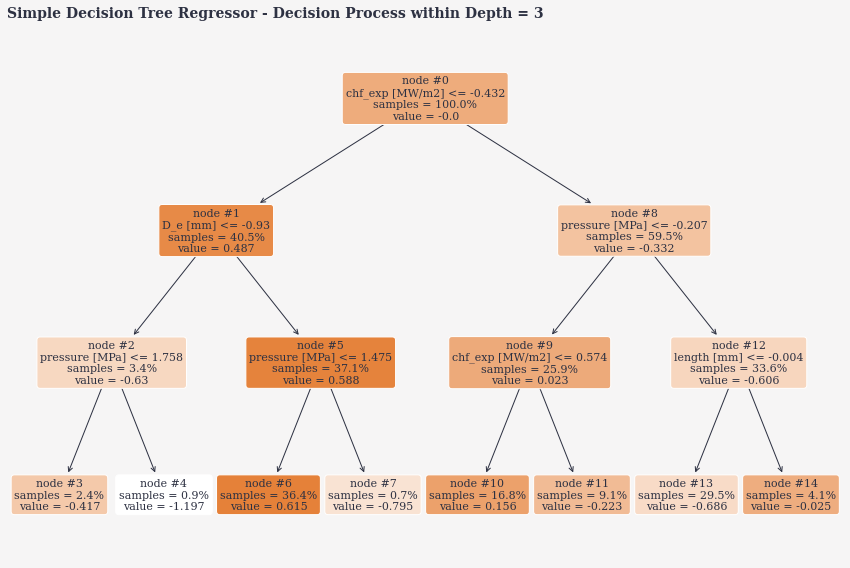

In [324]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.tree import plot_tree


tree_pipeline = make_pipeline(
    preprocess,
    TransformedTargetRegressor(
        regressor=DecisionTreeRegressor(max_depth=3, random_state=42),
        transformer=StandardScaler(),
    ),
)

tree_pipeline.fit(X_full_train, y_full_train)
tree_regressor = tree_pipeline[-1].regressor_
feature_names_out = tree_pipeline[0].get_feature_names_out()

fig, ax = plt.subplots(1, 1, figsize=(12, 8), tight_layout=True)
plot_tree(
    decision_tree=tree_regressor,
    feature_names=feature_names_out,
    filled=True,
    rounded=True,
    impurity=False,
    proportion=True,
    node_ids=True,
    ax=ax,
    fontsize=11,
)
plt.title(
    "Simple Decision Tree Regressor - Decision Process within Depth = 3", loc="left"
)
plt.show()


In [325]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import mutual_info_regression


forest_pipeline = make_pipeline(
    preprocess,
    TransformedTargetRegressor(
        regressor=RandomForestRegressor(random_state=42),
        transformer=StandardScaler(),
    ),
)
forest_pipeline.fit(X_full_train, y_full_train)
forest_info = forest_pipeline[-1].regressor_.feature_importances_

scaler = StandardScaler()
mutual_info = mutual_info_regression(
    X=preprocess.fit_transform(X_full_train),
    y=scaler.fit_transform(y_full_train.to_numpy().reshape(-1, 1)).ravel(),
    random_state=42,
)
mutual_info = mutual_info / np.sum(mutual_info)

importances = pd.DataFrame(
    [forest_info, mutual_info],
    columns=feature_names_out,
    index=["Random Forest", "Mutual Information"],
).T

importances = importances.loc[
    importances.mean(axis=1).sort_values(ascending=False).index
]

importances.style.background_gradient(DF_CMAP)


,Random Forest,Mutual Information
chf_exp [MW/m2],0.348207,0.090943
mass_flux [kg/m2-s],0.214158,0.078803
length [mm],0.089345,0.197658
D_h [mm],0.081510,0.203815
pressure [MPa],0.158636,0.115750
D_e [mm],0.082694,0.191462
author,0.020530,0.085741
geometry,0.004920,0.035829


In [329]:
melted = (
    importances.melt(
        var_name="Method",
        value_name="Importance",
        ignore_index=False,
    )
    .reset_index()
    .rename(columns={"index": "Feature"})[::-1]
)

fig = px.bar(
    data_frame=melted,
    x="Importance",
    y="Feature",
    color="Method",
    barmode="group",
    height=540,
    width=840,
    color_discrete_sequence=["#2D3142", "#FF7F51"],
    title="Normalised Feature Importances",
)
fig.update_layout(
    font_color=FONT_COLOR,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    bargroupgap=0.1,
)
fig.show()


In [334]:
from collections import defaultdict

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold


np.random.seed(42)
rmse_scores = defaultdict(list)

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

forest = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42),
    transformer=StandardScaler(),
)

for k, (train_ids, valid_ids) in enumerate(kfold.split(X_full_train, y_full_train)):

    X_train, y_train = X_full_train.iloc[train_ids], y_full_train.iloc[train_ids]
    X_valid, y_valid = X_full_train.iloc[valid_ids], y_full_train.iloc[valid_ids]

    X_train = preprocess.fit_transform(X_train)
    X_valid = preprocess.transform(X_valid)

    forest.fit(X_train, y_train)
    rmse = mean_squared_error(y_valid, forest.predict(X_valid), squared=False)

    for i, feature in enumerate(preprocess.get_feature_names_out()):
        X_shuffled = X_valid.copy()
        X_shuffled[:, i] = np.random.permutation(X_shuffled[:, i])  # type: ignore
        rmse_shuffled = mean_squared_error(
            y_valid, forest.predict(X_shuffled), squared=False
        )
        rmse_scores[feature].append(((rmse_shuffled - rmse) / rmse) * 100.0)

    print(CLR + "Fold:", f"{RED}{k}", f"\t{CLR}Baseline RMSE: {RED}{rmse:.3f}")


Fold: 0 	Baseline RMSE: 0.081
Fold: 1 	Baseline RMSE: 0.080
Fold: 2 	Baseline RMSE: 0.076
Fold: 3 	Baseline RMSE: 0.080
Fold: 4 	Baseline RMSE: 0.084
Fold: 5 	Baseline RMSE: 0.075
Fold: 6 	Baseline RMSE: 0.082
Fold: 7 	Baseline RMSE: 0.077
Fold: 8 	Baseline RMSE: 0.080
Fold: 9 	Baseline RMSE: 0.079


In [339]:
pd.DataFrame(rmse_scores).mean().round(2).sort_values().to_frame(
    name="Mean RSME Increase (%)"
).reset_index(names="Feature")


,Feature,Mean RSME Increase (%)
0,author,-0.15
1,geometry,-0.01
2,mass_flux [kg/m2-s],2.75
3,D_h [mm],2.78
4,D_e [mm],3.12
5,length [mm],5.83
6,pressure [MPa],13.51
7,chf_exp [MW/m2],32.99


In [340]:
rmse_increase_df = (
    pd.DataFrame(rmse_scores)
    .mean()
    .round(2)
    .sort_values()
    .to_frame(name="Mean RSME Increase (%)")
    .reset_index(names="Feature")
)

fig = px.bar(
    data_frame=rmse_increase_df,
    x="Mean RSME Increase (%)",
    y="Feature",
    height=540,
    width=849,
    color="Mean RSME Increase (%)",
    color_continuous_scale=color_map,
    title="Random Forest - Mean RSME Increase within Samples Permutation",
)
fig.update_layout(
    font_color=FONT_COLOR,
    title_font_size=18,
    plot_bgcolor=BACKGROUND_COLOR,
    paper_bgcolor=BACKGROUND_COLOR,
    coloraxis_showscale=False,
)
fig.show()


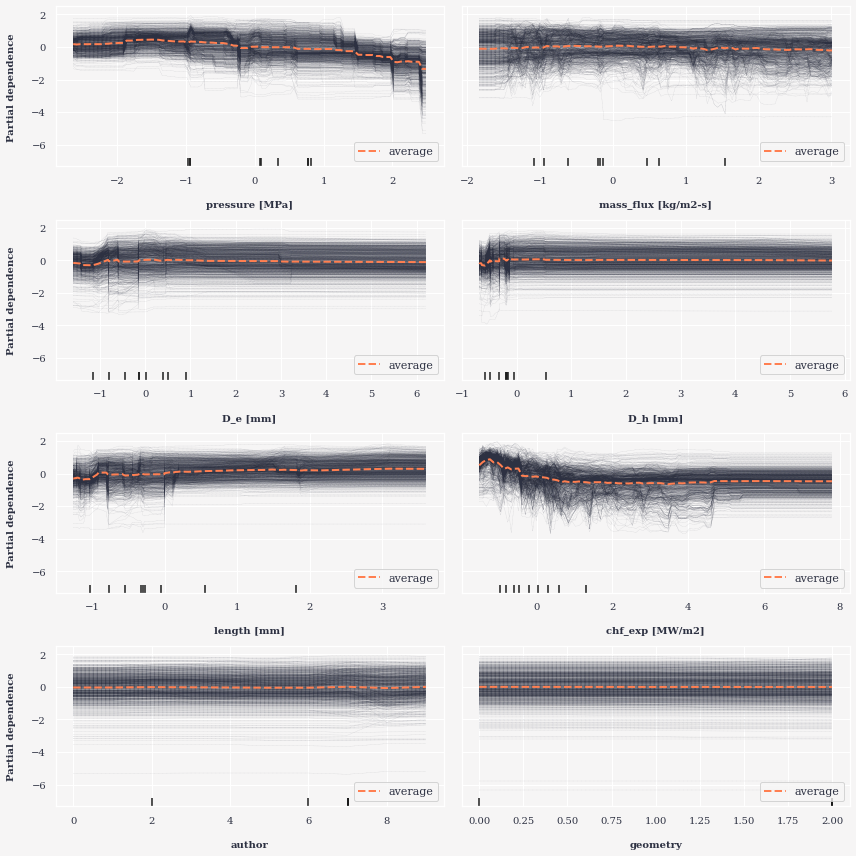

In [376]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence

X_ice = preprocess.fit_transform(X_full_train)
feature_names_out = preprocess.get_feature_names_out()
X_ice = pd.DataFrame(X_ice, columns=feature_names_out)
forest.fit(X_ice, y_full_train)

fig, axes = plt.subplots(4, 2, figsize=(12, 12), tight_layout=True, sharey=True)

PartialDependenceDisplay.from_estimator(
    forest.regressor_,
    X_ice,
    feature_names_out, 
    kind="both",
    percentiles=(0.1, 0.9),
    ice_lines_kw={
        "color": "#2D3142",
        "linewidth": 0.25,
        "alpha": 0.25,
        "linestyle": "--",
    },
    pd_line_kw={"color": "#FF7F51", "linewidth": 2.0},
    ax=axes.ravel(),
)

for ax in axes.ravel():
    ax.legend(loc="lower right")
    if ax not in (axes[0, 0], axes[1, 0], axes[2, 0], axes[3, 0]):
        ax.set_ylabel("")

plt.show()
